# V15 vs V20 data


We have some ERA data: "old" V15 data and "new" V20 data.

How does the data change when we go from old to new?

The maps below plot the difference between V20 and V15 for each feature.

We have 3 files: `lsmoro`, `clake` and `sfc`. The `sfc` file is dealt with separately below. 

In [75]:
import xarray as xr
import matplotlib.colors as mc
import matplotlib.colorbar as cb 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np


def correct_longitude(ds):    
    return ds.assign_coords({"longitude": (((ds.longitude + 180) % 360) - 180)})


def plot_xr_map(ds,z):
    
    """Scatter plot. Hacky. """


    x = ds.longitude
    y = ds.latitude
    z1 = abs(ds[z])
    
    #Get smallest non zero value
    tmp = z1.data
    if len(np.unique(tmp)) == 1:
        print('All values are the same for:', z)
        print ('Sum of unique differences = ',np.sum(np.unique(tmp)))
        print('Not plotting a map')
        print('-----------------------')
        return
        
    
    
    fig = plt.figure(figsize=[24,12])
    ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=0))

    
    minval = np.min(tmp[np.nonzero(tmp)])
    maxval = np.max(tmp[np.nonzero(tmp)])
   
    print(minval,maxval)

    cmap=plt.cm.magma
    #print(zmin)
    #norm = mc.Normalize(vmin=z1.min().data, vmax=z1.m().data)
    norm = mc.LogNorm(vmin=minval, vmax=maxval)

    sc=ax.scatter(x,y,s=1,c=cmap(norm(z1)),
                linewidths=1, alpha=.7)
    
    
    ax.set_title(z)    
    ax.coastlines()


    plt.show()


File:  lsmoro
1.1920929e-07 0.99998915


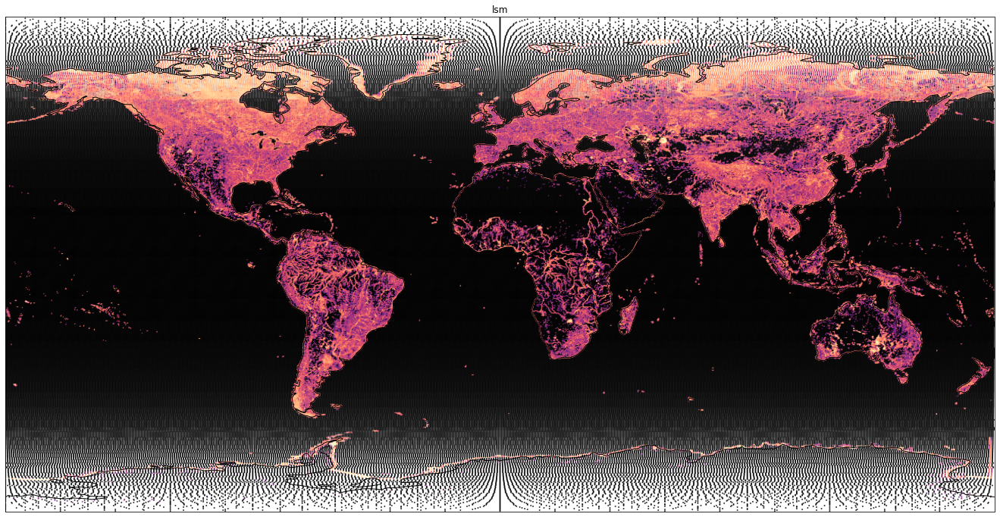

0.0015869141 1114.127


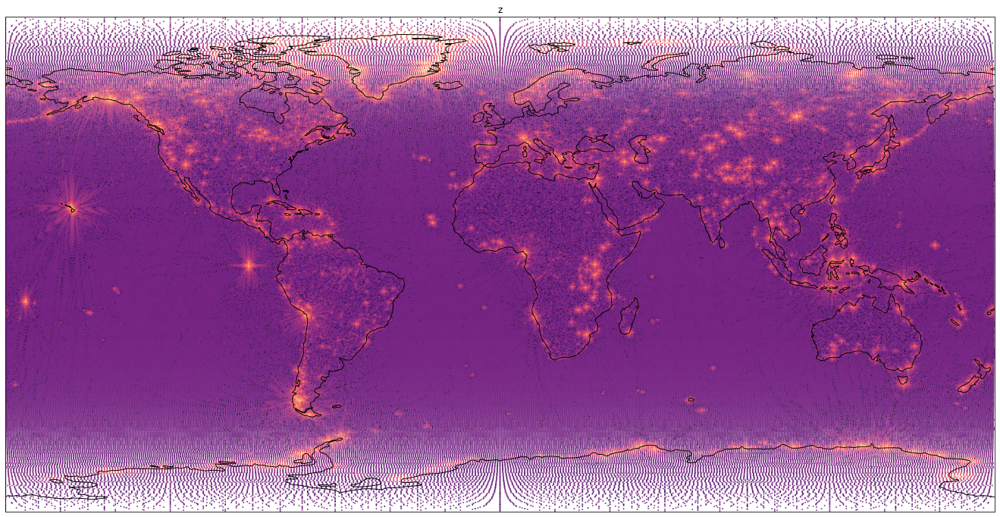

File:  clake
1.1920929e-07 0.99998474


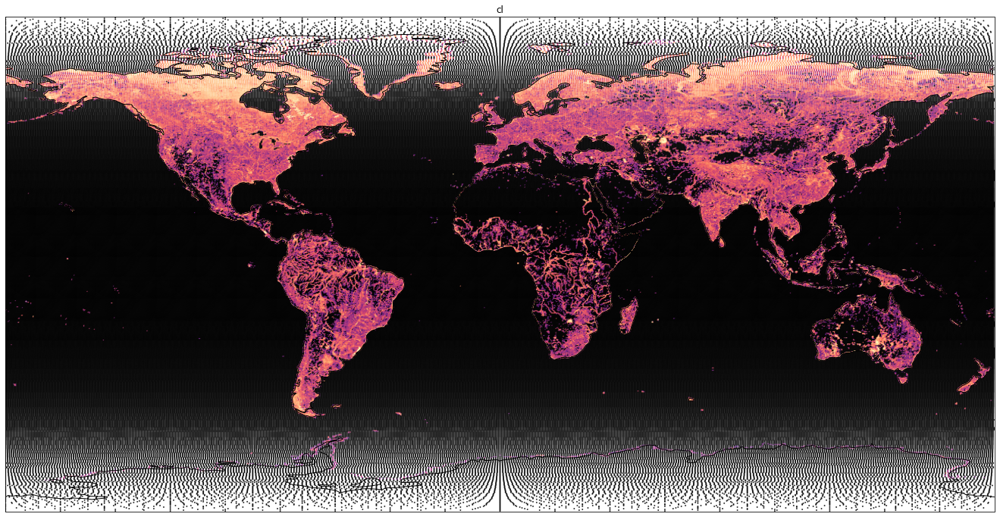

File:  lakedl
0.0009765625 2292.9082


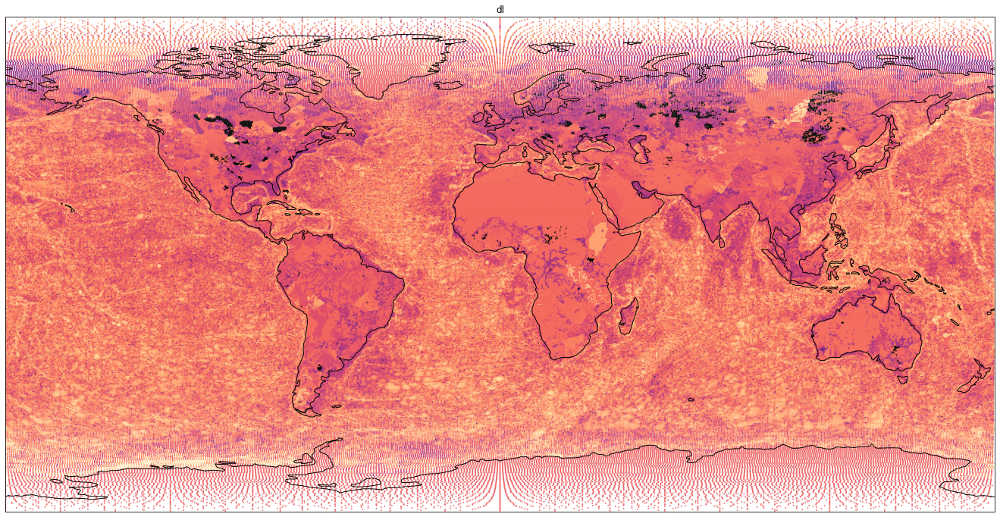

In [92]:
files = ['lsmoro','clake','lakedl']
version = ['v015', 'v020']
root = '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/'


import sys

for f in files:
    ds = []
    print ('File: ', f)
    for v in version:
        path = root+f'climate.{v}/climate.{v}/639l_2/{f}'
        
        ds_i= xr.open_dataset(path,engine='cfgrib',backend_kwargs={'indexpath': ''}) 
        ds.append(ds_i)
    
    #Take the difference    
    delta = ds[1] - ds[0]
    delta = correct_longitude(delta)
    
    #Plot it
    for variable in list(delta.keys()):
        
   
        plot_xr_map(delta,variable)

 



param:  anor
1.1920929e-07 3.1387825


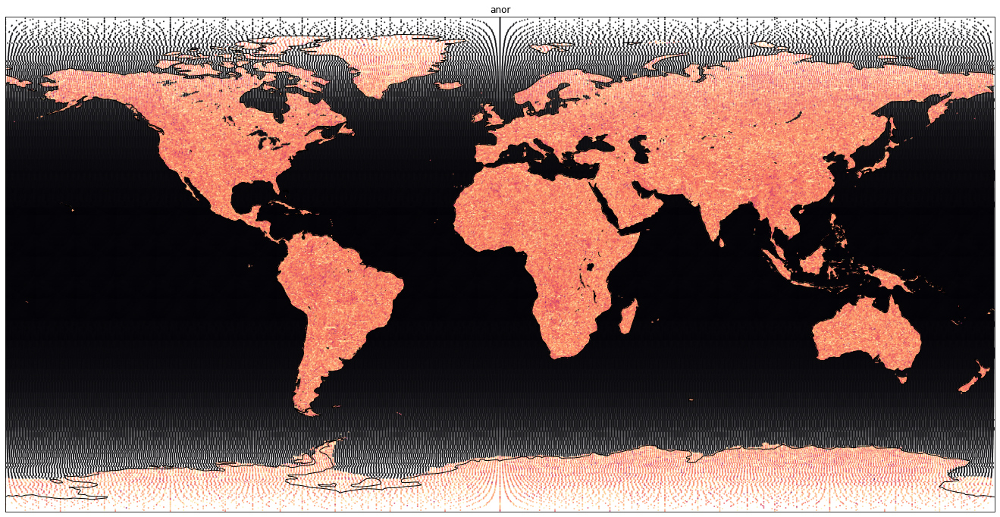

param:  isor
2.5629997e-06 0.9953299


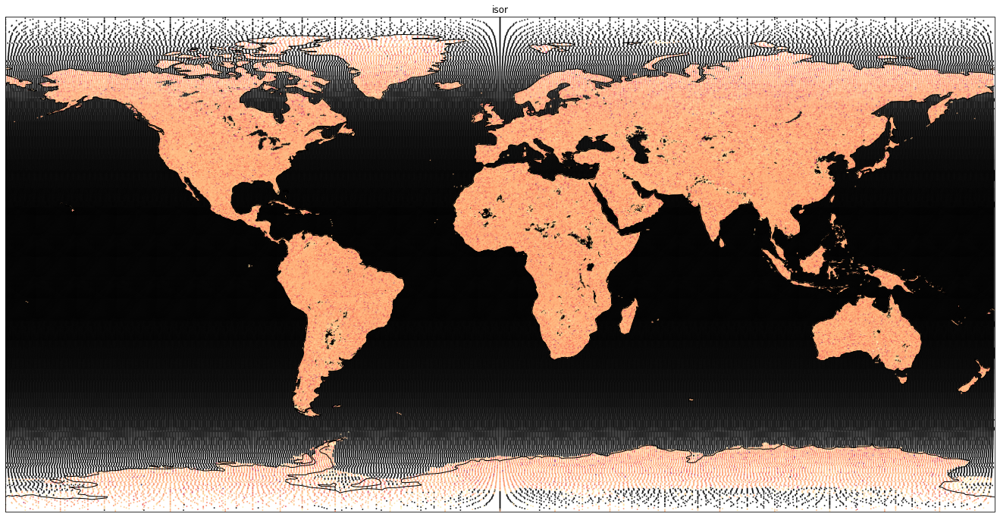

param:  slor
1.4901161e-08 0.10384883


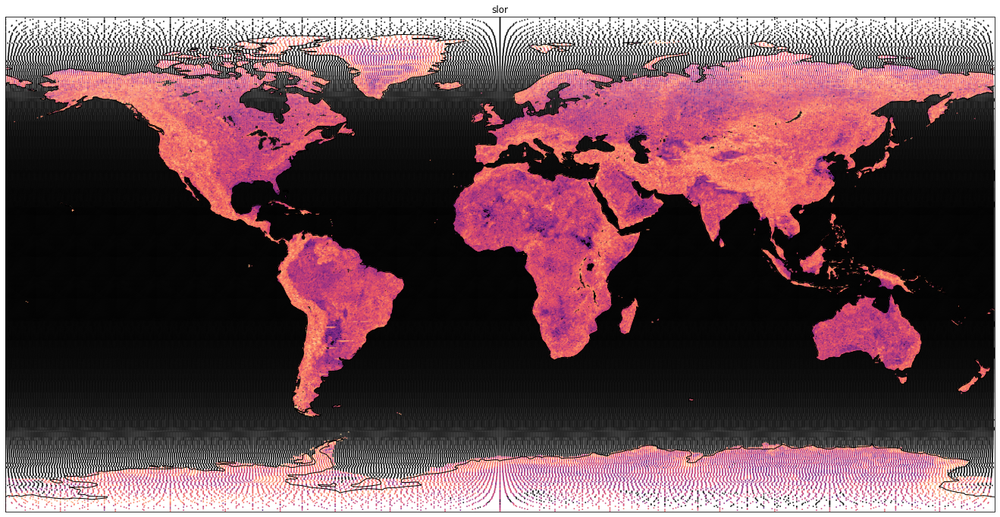

param:  sdor
0.00012207031 878.12805


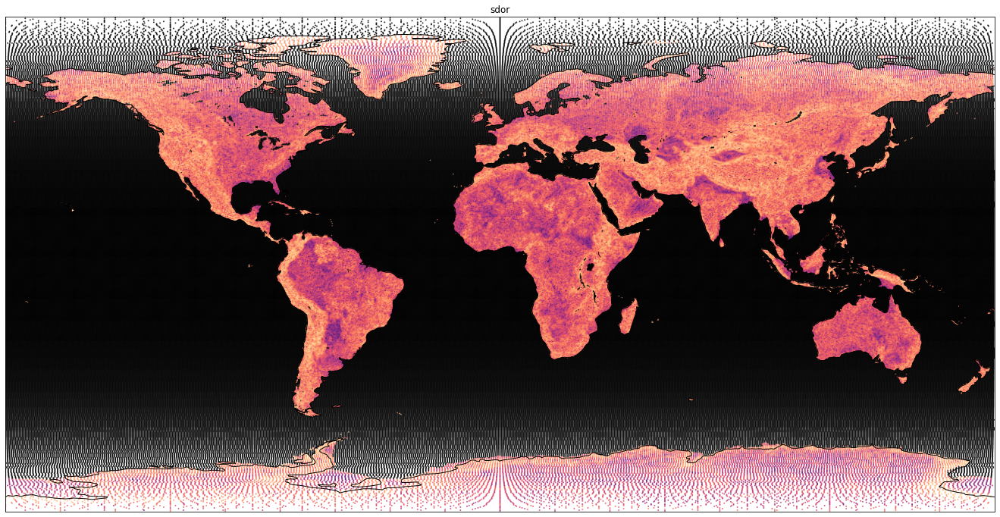

param:  sr
All values are the same for: sr
Sum of unique differences =  7.275958e-12
Not plotting a map
-----------------------
param:  lsrh
All values are the same for: lsrh
Sum of unique differences =  7.275958e-12
Not plotting a map
-----------------------
param:  cvh
1.1920929e-07 0.66867065


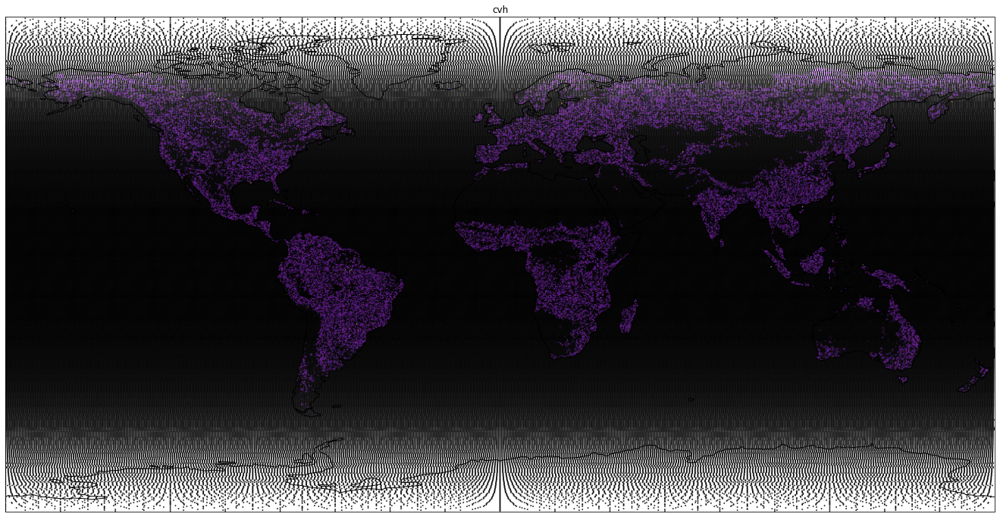

param:  cvl
1.1920929e-07 0.99799955


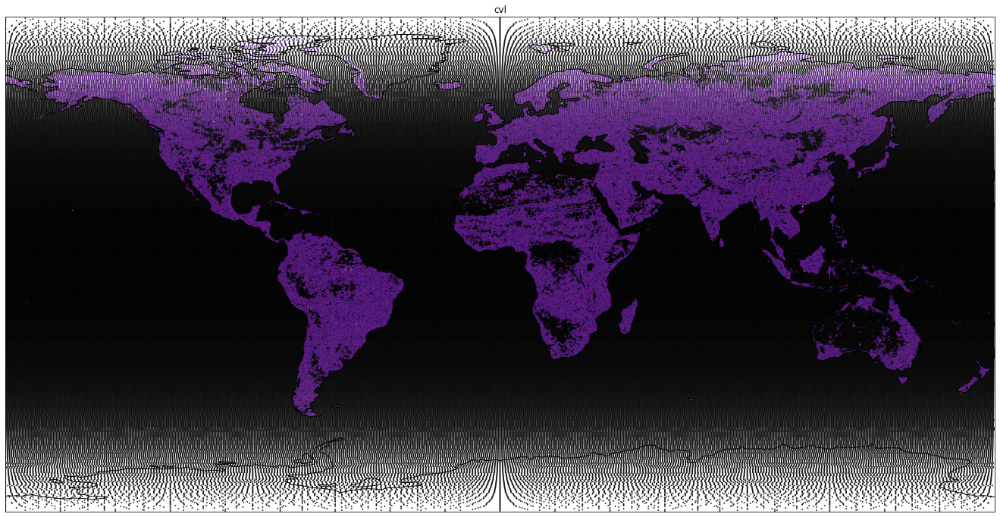

param:  tvh
All values are the same for: tvh
Sum of unique differences =  0.0
Not plotting a map
-----------------------
param:  tvl
All values are the same for: tvl
Sum of unique differences =  0.0
Not plotting a map
-----------------------


In [77]:
f = 'sfc'
version = ['v015', 'v020']
root = '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/'

#by hand, can't open whole file
params = ['anor','isor','slor','sdor','sr','lsrh','cvh','cvl','tvh','tvl'] 




for p in params:
    ds = []
    print ('param: ', p)
    for v in version:
        path = root+f'climate.{v}/climate.{v}/639l_2/{f}'
        
        ds_i= xr.open_dataset(path,engine='cfgrib',backend_kwargs={'indexpath': ''},filter_by_keys={'shortName': p}) 
        ds.append(ds_i)
    
    #Take the difference    
    delta = ds[1] - ds[0]
    delta = correct_longitude(delta)
    
    #Plot it
    for variable in list(delta.keys()):
        
   
        plot_xr_map(delta,variable)


In [90]:
def plot_single_map(ds,z):
    
    """Scatter plot. Hacky. """


    x = ds.longitude
    y = ds.latitude
    z1 = abs(ds[z])
    
    #Get smallest non zero value
    tmp = z1.data
    if len(np.unique(tmp)) == 1:
        print('All values are the same for:', z)
        print ('Sum of unique differences = ',np.sum(np.unique(tmp)))
        print('Not plotting a map')
        print('-----------------------')
        return
        
    
    
    fig = plt.figure(figsize=[24,12])
    ax = fig.add_subplot(111, projection=ccrs.PlateCarree(central_longitude=0))

    
    minval = np.min(tmp[np.nonzero(tmp)])
    maxval = np.max(tmp[np.nonzero(tmp)])
   
    print(minval,maxval)

    cmap=plt.cm.magma
    #print(zmin)
    #norm = mc.Normalize(vmin=z1.min().data, vmax=z1.m().data)
    norm = mc.LogNorm(vmin=1e-6, vmax=1e-2)

    sc=ax.scatter(x,y,s=1,c=cmap(norm(z1)),
                linewidths=1, alpha=.7)
    
    
    ax.set_title(z)    
    ax.coastlines()


    plt.show()


param:  cvh
1.1920929e-07 0.66867065


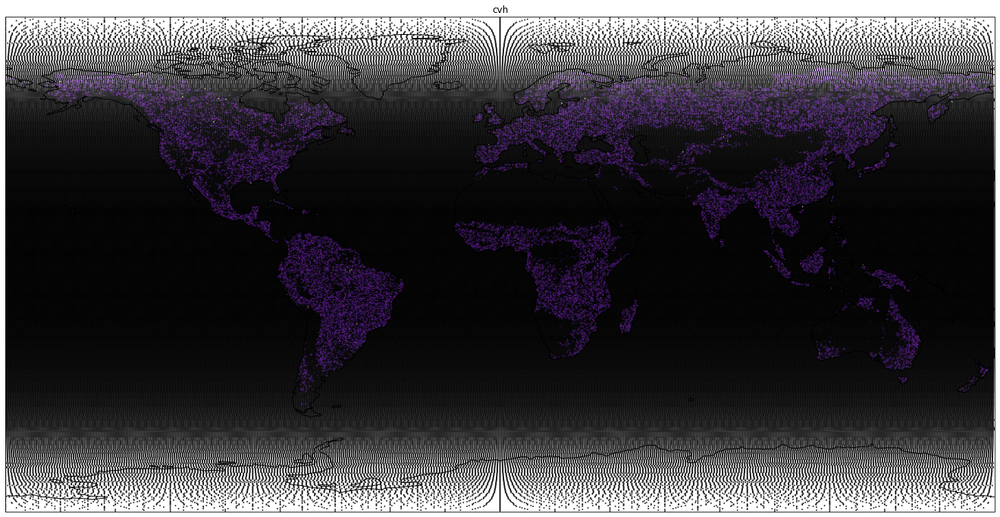

param:  cvl
1.1920929e-07 0.99799955


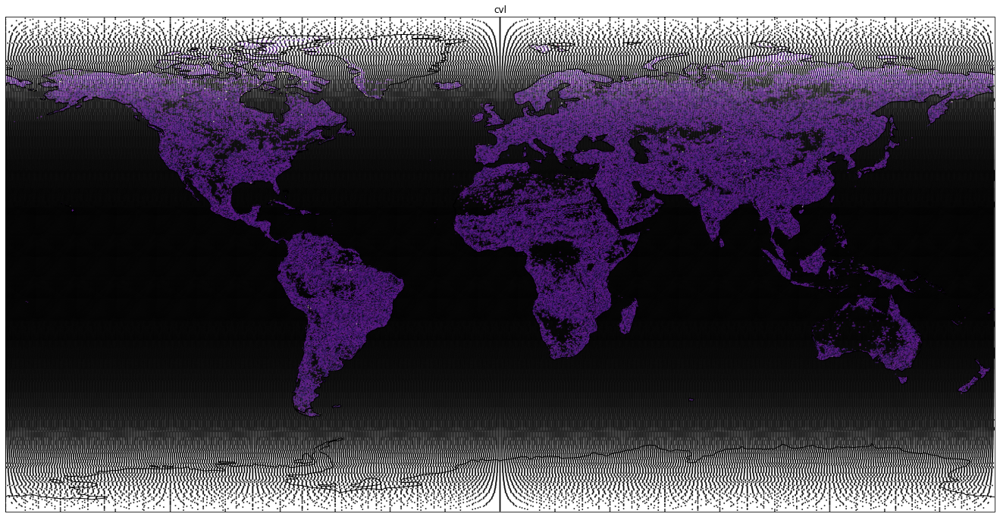

In [91]:
f = 'sfc'
version = ['v015', 'v020']
root = '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/'

#by hand, can't open whole file
params = ['cvh','cvl'] 




for p in params:
    ds = []
    print ('param: ', p)
    for v in version:
        path = root+f'climate.{v}/climate.{v}/639l_2/{f}'
        
        ds_i= xr.open_dataset(path,engine='cfgrib',backend_kwargs={'indexpath': ''},filter_by_keys={'shortName': p}) 
        ds.append(ds_i)
    
    #Take the difference    
    delta = ds[1] - ds[0]
    delta = correct_longitude(delta)
    
    #Plot it
    for variable in list(delta.keys()):
        
   
        plot_single_map(delta,variable)
